In [1]:
# for dataset handeling and calculations
import numpy as np 
import pandas as pd 

# for basic visualizations
import matplotlib.pyplot as plt
%matplotlib inline 

# for interactive visualizations
import plotly.express as px

# for modelling


from sklearn.metrics import r2_score
from statsmodels.tsa.arima_model import ARIMA
from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from tensorflow import keras
from pmdarima.arima import auto_arima
from keras.preprocessing.sequence import TimeseriesGenerator



# to hide warnings
import warnings
warnings.filterwarnings('ignore')

# for date and time operations
from datetime import datetime,timedelta

# for file and folder operations
import os


from sklearn.preprocessing import MinMaxScaler


np.random.seed(42)
#tf.random.set_seed(42)

In [2]:
# the file directory path
path = os.getcwd()

if os.path.exists(path+"\data")==False:
    print("Make file directory!")
    os.mkdir(path+"\datafor covid")

mypath = path+"\data"

In [3]:
os.chdir(mypath)

print(os.getcwd())

C:\Users\noelj\covid 19\data


# Data collection

In [4]:
#reading files from the url

confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recovered_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')


In [5]:
#saving the data into the csv files
confirmed_df.to_csv('confirmed_df.csv', index=False)
recovered_df.to_csv('recovered_df.csv', index=False)
deaths_df.to_csv('deaths_df.csv', index=False)

In [6]:
confirmed_df.shape

(271, 327)

In [7]:
recovered_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,36831,36946,37218,37260,37260,37393,37685,37879,37920,38032
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,18849,19384,19912,20484,20974,21286,21617,22180,22527,23072
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,53809,54405,54990,55538,56079,56617,57146,57648,58146,58146
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,5873,5940,5988,6066,6130,6171,6238,6293,6367,6452
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,7851,7932,8139,8244,8299,8335,8338,8353,8470,8579


In [8]:
deaths_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,1795,1822,1841,1846,1846,1864,1874,1900,1906,1919
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,810,822,839,852,870,889,905,922,936,951
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,2431,2447,2464,2480,2492,2501,2516,2527,2539,2554
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,76,76,76,77,77,78,78,78,78,78
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,348,350,351,352,353,354,354,354,355,358


In [9]:
#mearging all the datasets by using the melt function 
def melt_df(df,name):
    melted = pd.melt(df,id_vars=['Province/State','Country/Region','Lat','Long'],
                        value_vars=confirmed_df.columns[4:],
                        var_name='Date',value_name=name)
    return melted
melt_confirmed = melt_df(confirmed_df,'Confirmed')
melt_deaths = melt_df(deaths_df,'Deaths')
melt_recovered = melt_df(recovered_df,'Recovered')

In [10]:
print(melt_confirmed.shape)

(87533, 6)


In [11]:
#merging the three datasets
def merge(df1,df2):
    merged = pd.merge(left=df1,right=df2, how='left',
                      on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long'])
    return merged

main_df = merge(merge(melt_confirmed,melt_deaths),melt_recovered)

print(main_df.shape)
main_df.head(-5)


(87533, 8)


,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0,0,0.0
1,NaN,Albania,41.153300,20.168300,1/22/20,0,0,0.0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0,0,0.0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0,0,0.0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0,0,0.0
...,...,...,...,...,...,...,...,...
87523,NaN,United Kingdom,55.378100,-3.436000,12/9/20,1766819,62566,0.0
87524,NaN,Uruguay,-32.522800,-55.765800,12/9/20,8104,87,5564.0
87525,NaN,Uzbekistan,41.377491,64.585262,12/9/20,74352,611,71740.0
87526,NaN,Vanuatu,-15.376700,166.959200,12/9/20,1,0,1.0


In [12]:
main_df.to_csv('covid19_full_uncleaned.csv', index=False)

In [13]:
#dataset preparation
number_of_columns = main_df.shape[0]
percentage_of_missing_data = main_df.isnull().sum()/number_of_columns
print(percentage_of_missing_data)

Province/State    0.693727
Country/Region    0.000000
Lat               0.003690
Long              0.003690
Date              0.000000
Confirmed         0.000000
Deaths            0.000000
Recovered         0.077491
dtype: float64


In [14]:
#changing the state and province values to blank spaces('')
#filling the missing values in the recovered column with zero

main_df['Province/State'] = main_df['Province/State'].fillna('')
main_df['Recovered'] = main_df['Recovered'].fillna(0)
# the recovered values are being coverted to int datatype
main_df['Recovered'] = main_df['Recovered'].astype('int')

In [15]:
'''changing certain names of the contries to match with the regions 
'''
main_df['Country/Region'] = main_df['Country/Region'].replace('Korea, South', "South Korea")
main_df['Country/Region'] = main_df['Country/Region'].replace('Mainland China', 'China')
main_df['Country/Region'] = main_df['Country/Region'].replace('Taiwan*', 'Taiwan')
main_df['Country/Region'] = main_df['Country/Region'].replace('Congo (Kinshasa)', 'Democratic Republic of the Congo')
main_df['Country/Region'] = main_df['Country/Region'].replace('Congo (Brazzaville)', 'Republic of the Congo')
main_df.loc[main_df['Province/State']=='Greenland', 'Country/Region'] = 'Greenland'

In [16]:
'''
changing the format of the date  from the yy/dd/mm 00:00:00  to just yy/dd/mm
with the help of normalize() function
'''
main_df['Date'] = pd.to_datetime(main_df['Date']).dt.normalize()

print(main_df['Date'].describe())
main_df['Date']

count                   87533
unique                    323
top       2020-10-28 00:00:00
freq                      271
first     2020-01-22 00:00:00
last      2020-12-09 00:00:00
Name: Date, dtype: object


0       2020-01-22
1       2020-01-22
2       2020-01-22
3       2020-01-22
4       2020-01-22
           ...    
87528   2020-12-09
87529   2020-12-09
87530   2020-12-09
87531   2020-12-09
87532   2020-12-09
Name: Date, Length: 87533, dtype: datetime64[ns]

In [17]:
# adding new column with a new feature in the main sata frame
main_df['Active'] = main_df['Confirmed'] - main_df['Deaths'] - main_df['Recovered']

main_df.head(-5)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
0,,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0
1,,Albania,41.153300,20.168300,2020-01-22,0,0,0,0
2,,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0
3,,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0
4,,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0
...,...,...,...,...,...,...,...,...,...
87523,,United Kingdom,55.378100,-3.436000,2020-12-09,1766819,62566,0,1704253
87524,,Uruguay,-32.522800,-55.765800,2020-12-09,8104,87,5564,2453
87525,,Uzbekistan,41.377491,64.585262,2020-12-09,74352,611,71740,2001
87526,,Vanuatu,-15.376700,166.959200,2020-12-09,1,0,1,0


In [18]:
#saving the file to csv
main_df.to_csv('covid19_full_cleaned.csv', index=False)

In [19]:
   #grouping the saved data frame Date and Country region 
covid19_date_country = main_df.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum()\
.reset_index()


In [20]:
    # adding new columns which containing new confirmed, new deaths and new recovered for each day
new_col = covid19_date_country.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum()\
                                    .diff().reset_index()

In [21]:
  # renameing  some columns of new_col
new_col.columns = ['Country/Region', 'Date', 'New confirmed', 'New deaths', 'New recovered']
columns = ['New confirmed', 'New deaths', 'New recovered']

In [22]:
    # setting a fix value for the first row of each country
first_rows = (new_col['Country/Region'] != new_col['Country/Region'].shift(1))
new_col.loc[first_rows, 'New confirmed'] = 0
new_col.loc[first_rows, 'New deaths'] = 0
new_col.loc[first_rows, 'New recovered'] = 0

In [23]:
# merging new values
covid19_date_country = pd.merge(covid19_date_country, new_col, on=['Country/Region', 'Date'])

In [24]:
# filling the missing values with 0
covid19_date_country = covid19_date_country.fillna(0)
covid19_date_country['New confirmed'] = covid19_date_country['New confirmed'].apply(lambda x: 0 if x<0 else x)

In [25]:
# fixing datatypes of the new columns
covid19_date_country[columns] = covid19_date_country[columns].astype('int')

In [26]:
covid19_date_country.tail()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered
62011,2020-12-09,Vietnam,1381,35,1225,121,4,0,1
62012,2020-12-09,West Bank and Gaza,102992,890,76893,25209,1883,23,1636
62013,2020-12-09,Yemen,2079,606,1383,90,1,0,1
62014,2020-12-09,Zambia,18062,364,17295,403,99,0,27
62015,2020-12-09,Zimbabwe,11007,304,9147,1556,95,1,85


In [27]:
# save as .csv file
covid19_date_country.to_csv('covid19_date_country.csv', index=False)

# save ire_df.csv file
ire_df=covid19_date_country[covid19_date_country['Country/Region'] == 'Ireland']
ire_df.to_csv('covid19_ire.csv',index=False)

In [28]:
# to get the latest values of each country
covid19_country_latest = covid19_date_country[covid19_date_country['Date']==max(covid19_date_country['Date'])].reset_index(drop=True)\
                    .drop('Date', axis=1)

print(covid19_country_latest.shape)
print(covid19_country_latest['Country/Region'].unique().shape)

(192, 8)
(192,)


In [29]:
# mortality and recovery rates per 100
covid19_country_latest['Recovery rate(per 100)'] = \
                np.round(100*covid19_country_latest['Recovered']/covid19_country_latest['Confirmed'],2)
covid19_country_latest['Mortality rate(per 100)'] = \
                np.round(100*covid19_country_latest['Deaths']/covid19_country_latest['Confirmed'],2)


In [30]:
#filling the missing values with 0

columns = ['Recovery rate(per 100)', 'Mortality rate(per 100)']
covid19_country_latest[columns] = covid19_country_latest[columns].fillna(0)

In [31]:
#saving the file to .csv
covid19_country_latest.to_csv('covid19_country_latest.csv', index=False)

In [32]:
"""grouping the data on the bases of the date"""

covid19_world = covid19_date_country.groupby('Date')['Confirmed', 'Deaths', 'Recovered','Active', 'New confirmed', 'New deaths',
                                                'New recovered'].sum().reset_index()

# mortality and recovery rates

covid19_world['Recovery rate(per 100)'] = \
                np.round(100*covid19_world['Recovered']/covid19_world['Confirmed'],2)
covid19_world['Mortality rate(per 100)'] = \
                np.round(100*covid19_world['Deaths']/covid19_world['Confirmed'],2)

# the countries which have a non-zero confirmed case on each date
covid19_world['Number of countries'] = covid19_date_country[covid19_date_country['Confirmed']!=0].groupby('Date')['Country/Region']\
                                .unique().apply(len).values

# filling all the missing values with 0
columns = ['Recovery rate(per 100)', 'Mortality rate(per 100)']
covid19_world[columns] = covid19_world[columns].fillna(0)

covid19_world.head(-3)

,Date,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),Number of countries
0,2020-01-22,555,17,28,510,0,0,0,5.05,3.06,6
1,2020-01-23,654,18,30,606,99,1,2,4.59,2.75,8
2,2020-01-24,941,26,36,879,287,8,6,3.83,2.76,9
3,2020-01-25,1434,42,39,1353,493,16,3,2.72,2.93,11
4,2020-01-26,2118,56,52,2010,684,14,13,2.46,2.64,13
...,...,...,...,...,...,...,...,...,...,...,...
315,2020-12-02,64530525,1493741,41162419,21874365,646584,12436,456111,-2.77,2.31,192
316,2020-12-03,65221064,1506259,41593394,22121411,690539,12518,430975,-2.08,2.31,192
317,2020-12-04,65899408,1518669,42007579,22373160,678344,12410,414185,-1.43,2.30,192
318,2020-12-05,66540007,1528867,42440311,22570829,640599,10198,432732,-0.77,2.30,192


In [33]:
# saving the file to csv
covid19_world.to_csv('covid19_world.csv', index=False)

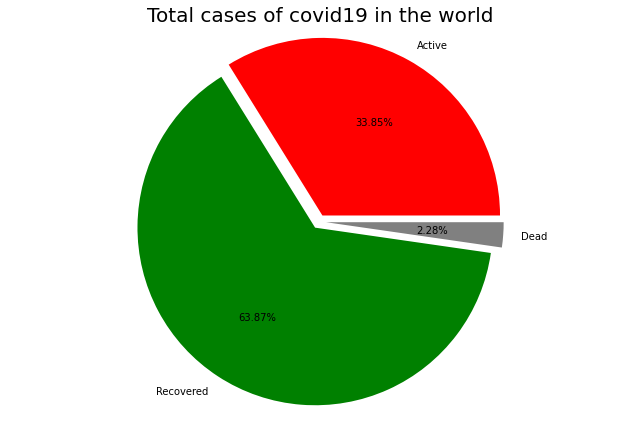

In [34]:
#getting the latest stattus globally 
covid19_world['Date'] = pd.to_datetime(covid19_world['Date'])
last_day = covid19_world.shape[0]-1
labels = ['Active','Recovered','Dead']
sizes = [covid19_world['Active'][last_day],covid19_world['Recovered'][last_day],covid19_world['Deaths'][last_day]]

plt.figure(figsize= (9,6))
plt.pie(sizes, labels=labels, autopct='%1.2f%%', startangle=0, explode =[0.04,0.04,0.04],
        colors = ['red','green','gray'])
#centre_circle = plt.Circle((0,0),0.4,fc='white')

fig = plt.gcf()
#fig.gca().add_artist(centre_circle)
plt.title('Total cases of covid19 in the world',fontsize = 20)
plt.axis('equal')  
plt.tight_layout()

In [35]:
## total numbers of covid cases of the world 

date_df2 = covid19_world[['Confirmed', 'Recovered', 'Deaths','Active','Recovery rate(per 100)',
                         'Mortality rate(per 100)','Number of countries']].tail()

date_df2


,Confirmed,Recovered,Deaths,Active,Recovery rate(per 100),Mortality rate(per 100),Number of countries
318,66540007,42440311,1528867,22570829,-0.77,2.30,192
319,67073702,42749422,1536055,22788225,-0.30,2.29,192
320,67591311,43151325,1544532,22895454,0.30,2.29,192
321,68225723,43586386,1556834,23082503,0.93,2.28,192
322,68894596,44006267,1569374,23318955,1.53,2.28,192


In [36]:
# getting the iso codes of the countries vor visualisation 
import pycountry

dff = pd.read_csv('covid19_date_country.csv')

list_countries = dff['Country/Region'].unique().tolist()
i_country_code = {}  # To hold the country names and their ISO 3 code
for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        country_code = country_data[0].alpha_3
        i_country_code.update({country: country_code})
    except:
        print('could not add ISO 3 code for ->', country)

# create a new column iso_a in dff
for k, v in i_country_code.items():
    dff.loc[(dff['Country/Region'] == k), 'iso_a'] = v

could not add ISO 3 code for -> Burma
could not add ISO 3 code for -> Democratic Republic of the Congo
could not add ISO 3 code for -> Diamond Princess
could not add ISO 3 code for -> Laos
could not add ISO 3 code for -> MS Zaandam
could not add ISO 3 code for -> South Korea
could not add ISO 3 code for -> West Bank and Gaza


In [37]:
fig = px.choropleth(data_frame = dff, 
                    locations= "iso_a",
                    color= "Confirmed",
                    hover_name= "Country/Region",
                    color_continuous_scale="Viridis_r",
                    animation_frame= "Date",
                    title='Spread of covid 19 confirmed cases Globaly')
fig.update_layout(
    autosize=False,
    width=900,
    height=600,
    margin=dict(
        l=1,
        r=1,
        b=100,
        t=100,
        pad=4
    ),
)
fig.show()

In [38]:
fig = px.choropleth(data_frame = dff, 
                    locations= "iso_a",
                    color= "Deaths",
                    hover_name= "Country/Region",
                    color_continuous_scale="Viridis_r",
                    animation_frame= "Date",
                    title='Global Deaths due to covid-19')
fig.update_layout(
    autosize=False,
    width=900,
    height=600,
    margin=dict(
        l=1,
        r=1,
        b=100,
        t=100,
        pad=4
    ),
)
fig.show()

In [39]:
most_affected=['US','Brazil','India','Russia','Peru','South Africa', 'Mexico','Chile', 'United Kingdom','Iran']

dates = covid19_world['Date'][50:]


def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected[i]].iloc[50:,:]
    return df
def comp_plt(col):
    plt.figure(figsize= (20,10))
    plt.xticks(rotation = 60 ,fontsize = 11)
    plt.yticks(fontsize = 10)
    plt.xlabel("Dates",fontsize = 20)
    plt.ylabel('%s cases' % (col),fontsize = 20)
    plt.title("Covid-19 %s Cases of  top 10 most effected countries" % (col), fontsize = 20)

    for i in range(len(most_affected)):
        plt.plot_date(y= country_df(i)[col].values,x= dates,label = most_affected[i],alpha=0.6,linestyle ='-')
    plt.legend();

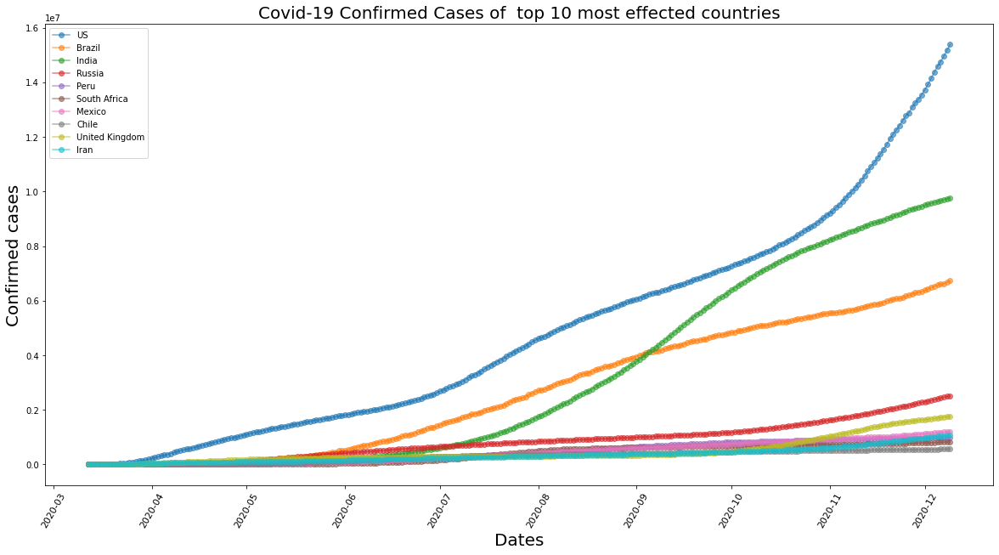

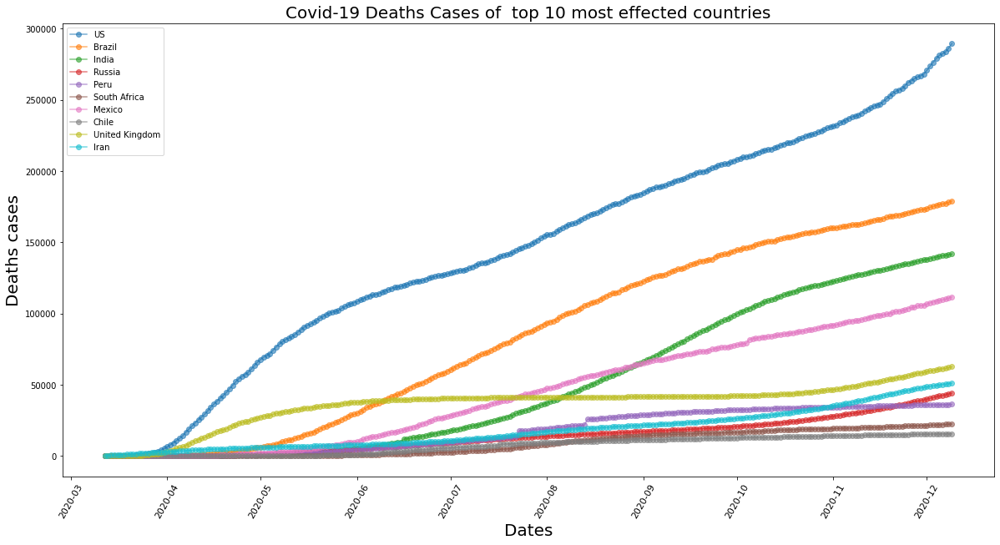

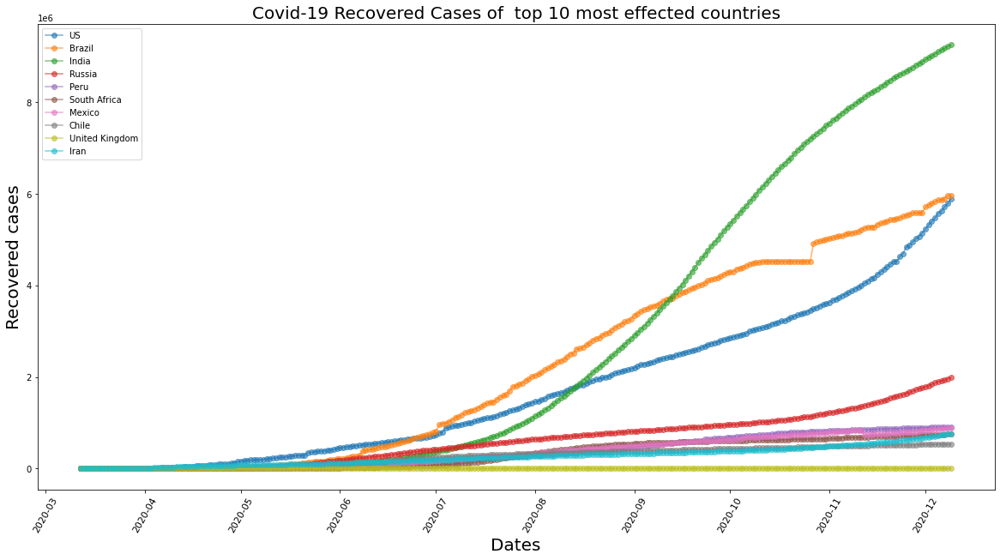

In [40]:

comp_plt('Confirmed')
comp_plt('Deaths')
comp_plt('Recovered')

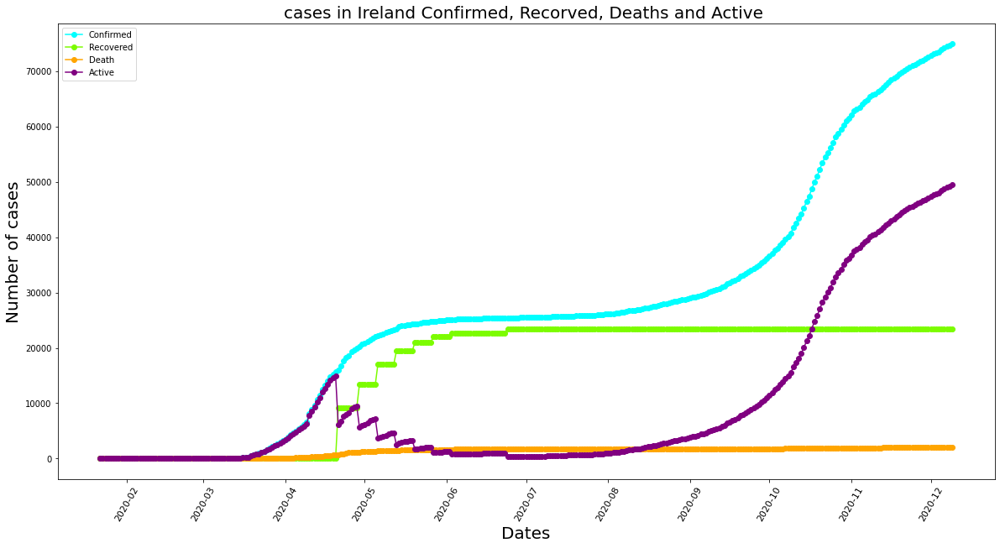

In [41]:
dates = covid19_world['Date'][:]

ire_df=covid19_date_country[covid19_date_country['Country/Region'] == 'Ireland'].iloc[:,:] 

plt.figure(figsize= (20,10))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('Number of cases',fontsize = 20)
plt.title("cases in Ireland Confirmed, Recorved, Deaths and Active " , fontsize = 20)

ax1 = plt.plot_date(y= ire_df['Confirmed'].values,x= dates,label = 'Confirmed',linestyle ='-',color = 'cyan')
ax2 = plt.plot_date(y= ire_df['Recovered'].values,x= dates,label = 'Recovered',linestyle ='-',color = 'lawngreen')
ax3 = plt.plot_date(y= ire_df['Deaths'].values,x= dates,label = 'Death',linestyle ='-',color = 'orange')
ax4 = plt.plot_date(y= ire_df['Active'].values,x= dates,label = 'Active',linestyle ='-',color = 'purple')
plt.legend()

In [42]:
covid19_country_latest.copy().sort_values('Confirmed',ascending=False)\
                    .reset_index(drop=True).iloc[:30,:].style.bar(align='left',width=80,color='gold')

,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100)
0,US,15386562,289373,5889896,9207293,221267,3124,102981,38.280000,1.880000
1,India,9767371,141772,9253306,372293,31521,412,37725,94.740000,1.450000
2,Brazil,6728452,178995,5966118,583339,53453,836,626,88.670000,2.660000
3,Russia,2518551,44220,1989710,484621,25838,546,25846,79.000000,1.760000
4,France,2377913,56752,178937,2142224,14717,299,1379,7.520000,2.390000
5,United Kingdom,1771545,62663,3778,1705104,16634,533,13,0.210000,3.540000
6,Italy,1770149,61739,997895,710515,12755,499,39266,56.370000,3.490000
7,Spain,1712101,47019,150376,1514706,9773,373,0,8.780000,2.750000
8,Argentina,1475222,40222,1311488,123512,5303,213,5901,88.900000,2.730000
9,Colombia,1392133,38308,1287597,66228,7523,150,9271,92.490000,2.750000


In [43]:
# for modelling


from sklearn.metrics import r2_score
from statsmodels.tsa.arima_model import ARIMA
from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from tensorflow import keras
from pmdarima.arima import auto_arima
from keras.preprocessing.sequence import TimeseriesGenerator



In [44]:
# convert dates to proper date formats

covid19_date_country['Date'] = pd.to_datetime(covid19_date_country['Date'])

ire_df['Date'] = pd.to_datetime(ire_df['Date'])

covid19_world['Date'] = pd.to_datetime(covid19_world['Date'])

In [45]:

# find numbers related to dates
numbers_of_dates = covid19_world.index.values.reshape(-1, 1)

# number of days in future considered to forecast
future_days = 10

# find numbers related to days from start to future
numbers_start_to_futures = np.array([i for i in range(covid19_world.shape[0]+future_days)]).reshape(-1, 1)

# first date in the dataset
first_date = covid19_world['Date'].tolist()[0]

# find dates related to days from start to future for better visualization
dates_start_to_futures = pd.Series([(first_date + timedelta(days=i)) for i in range(len(numbers_start_to_futures))])
print(dates_start_to_futures.shape)

(333,)


In [48]:
model_arima= auto_arima(covid19_world['Confirmed'],trace=True, error_action='ignore', start_p=1,start_q=1,max_p=10,max_q=10,
                   suppress_warnings=True,stepwise=False,seasonal=False)
model_arima.fit(covid19_world['Confirmed'])

 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=7635.693, Time=0.01 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=7626.144, Time=0.04 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=7616.108, Time=0.10 sec
 ARIMA(0,2,4)(0,0,0)[0] intercept   : AIC=7554.901, Time=0.21 sec
 ARIMA(0,2,5)(0,0,0)[0] intercept   : AIC=7516.145, Time=0.31 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=7635.296, Time=0.01 sec
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=7602.677, Time=0.09 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=7699.552, Time=0.19 sec
 ARIMA(1,2,4)(0,0,0)[0] intercept   : AIC=7549.141, Time=0.33 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=7625.288, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=7568.956, Time=0.12 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=7595.184, Time=0.44 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=7453.732, Time=0.45 sec
 ARIMA(3,2,0)(0,0,0)

ARIMA(order=(2, 2, 3), scoring_args={}, suppress_warnings=True)

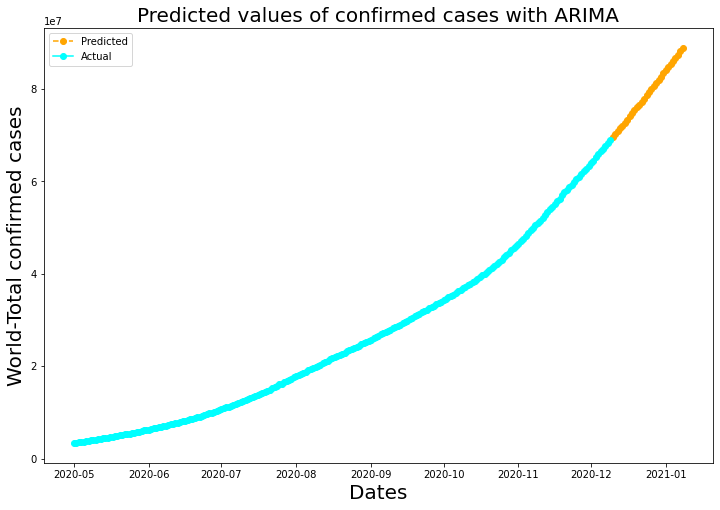

In [49]:
# arima model not included in the research just done for my understanding


data = pd.DataFrame(columns = ['Date','y'])
data['Date'] = covid19_world['Date'][100:]
data['y'] = covid19_world['Confirmed'][100:].values

arima = ARIMA(data['y'], order=(2, 2, 3))
arima = arima.fit(trend='c', full_output=True, disp=True)
forecast = arima.forecast(steps= 30)
pred = list(forecast[0])

start_date = data['Date'].max()
prediction_dates = []
for i in range(30):
    date = start_date + timedelta(days=1)
    prediction_dates.append(date)
    start_date = date
plt.figure(figsize= (12,8))
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total confirmed cases',fontsize = 20)
plt.title("Predicted values of confirmed cases with ARIMA" , fontsize = 20)

plt.plot_date(y= pred,x= prediction_dates,linestyle ='dashed',color = 'orange',label = 'Predicted');
plt.plot_date(y=data['y'],x=data['Date'],linestyle = '-',color = 'cyan',label = 'Actual');
plt.legend();


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


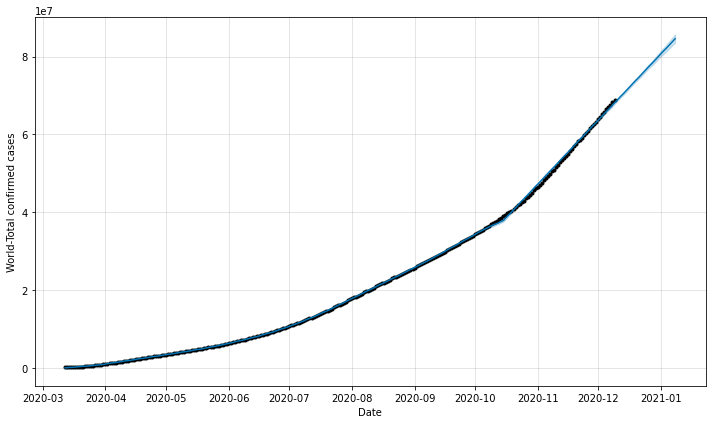

In [50]:
data = pd.DataFrame(columns = ['ds','y'])
data['ds'] = covid19_world['Date'][50:]
data['y'] = covid19_world['Confirmed'][50:].values

prop=Prophet()
prop.fit(data)
future=prop.make_future_dataframe(periods=30)
prop_forecast=prop.predict(future)
forecast = prop_forecast[['ds','yhat']].tail(30)

fig = plot_plotly(prop, prop_forecast)
fig = prop.plot(prop_forecast,xlabel='Date',ylabel='World-Total confirmed cases')

In [51]:
prop_forecast.yhat

0     -3.147415e+04
1      3.904608e+04
2      8.025684e+04
3      8.996286e+04
4      1.158312e+05
           ...     
298    8.236043e+07
299    8.290867e+07
300    8.348125e+07
301    8.404264e+07
302    8.461757e+07
Name: yhat, Length: 303, dtype: float64

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


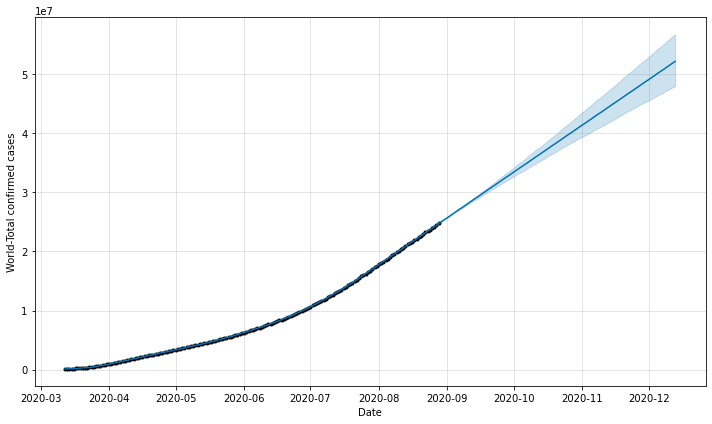

In [52]:
data = pd.DataFrame(columns = ['ds','y'])
data['ds'] = covid19_world['Date'][50:220]
data['y'] = covid19_world['Confirmed'][50:220].values
prop=Prophet()
prop.fit(data)
future=prop.make_future_dataframe(periods=107)
prop_forecast=prop.predict(future)
forecast = prop_forecast[['ds','yhat']].tail(107)

fig = plot_plotly(prop, prop_forecast)
fig = prop.plot(prop_forecast,xlabel='Date',ylabel='World-Total confirmed cases')

In [53]:
datar = pd.DataFrame(columns = ['ds','y'])
datar['ds'] = covid19_world['Date'][216:]
datar['y'] = covid19_world['Confirmed'][216:].values

In [54]:
r2_score(datar.y, forecast.yhat)

0.7410487570227484

In [55]:

def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100

In [56]:
mape(datar.y, forecast.yhat)

8.151203314201725

In [58]:
model_arima= auto_arima(covid19_world['Deaths'],trace=True, error_action='ignore', start_p=1,start_q=1,max_p=10,max_q=10,
                   suppress_warnings=True,stepwise=False,seasonal=False)
model_arima.fit(covid19_world['Deaths'])

 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=5512.380, Time=0.01 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=5491.573, Time=0.12 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=5440.061, Time=0.25 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=5437.073, Time=0.38 sec
 ARIMA(0,2,4)(0,0,0)[0] intercept   : AIC=5391.147, Time=0.51 sec
 ARIMA(0,2,5)(0,0,0)[0] intercept   : AIC=5384.225, Time=0.58 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=5510.638, Time=0.02 sec
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=5449.698, Time=0.26 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=5440.152, Time=0.36 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=5411.148, Time=0.49 sec
 ARIMA(1,2,4)(0,0,0)[0] intercept   : AIC=5381.381, Time=0.61 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=5496.321, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=5428.524, Time=0.36 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=5345.523, Time=0.51 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=5303.933, Time=0.58 sec
 ARIMA(3,2

ARIMA(order=(2, 2, 3), scoring_args={}, suppress_warnings=True)

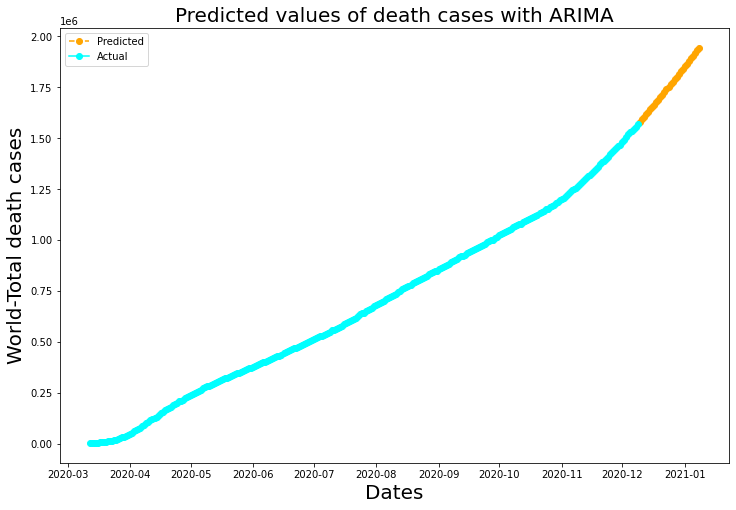

In [59]:
# arima model not included in the research just done for my understanding


data = pd.DataFrame(columns = ['Date','y'])
data['Date'] = covid19_world['Date'][50:]
data['y'] = covid19_world['Deaths'][50:].values

arima = ARIMA(data['y'], order=(2, 2, 0))
arima = arima.fit(trend='c', full_output=True, disp=True)
forecast = arima.forecast(steps= 30)
pred = list(forecast[0])

start_date = data['Date'].max()
prediction_dates = []
for i in range(30):
    date = start_date + timedelta(days=1)
    prediction_dates.append(date)
    start_date = date
plt.figure(figsize= (12,8))
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total death cases',fontsize = 20)
plt.title("Predicted values of death cases with ARIMA" , fontsize = 20)

plt.plot_date(y= pred,x= prediction_dates,linestyle ='dashed',color = 'orange',label = 'Predicted');
plt.plot_date(y=data['y'],x=data['Date'],linestyle = '-',color = 'cyan',label = 'Actual');
plt.legend();

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


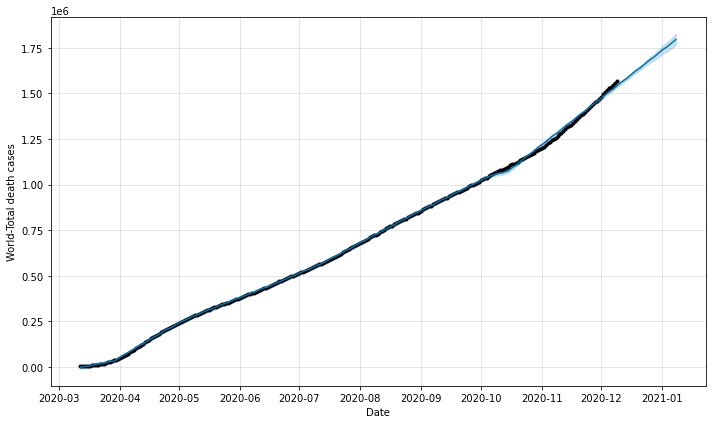

In [60]:

data = pd.DataFrame(columns = ['ds','y'])
data['ds'] = covid19_world['Date'][50:]
data['y'] = covid19_world['Deaths'][50:].values

prop=Prophet()
prop.fit(data)
future=prop.make_future_dataframe(periods=30)
prop_forecast=prop.predict(future)
forecast = prop_forecast[['ds','yhat']].tail(30)

fig = plot_plotly(prop, prop_forecast)
fig = prop.plot(prop_forecast,xlabel='Date',ylabel='World-Total death cases')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


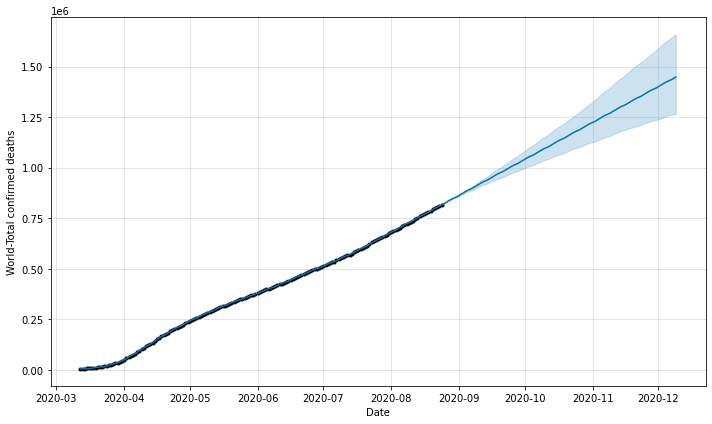

In [61]:
data = pd.DataFrame(columns = ['ds','y'])
data['ds'] = covid19_world['Date'][50:216]
data['y'] = covid19_world['Deaths'][50:216].values
prop=Prophet()
prop.fit(data)
future=prop.make_future_dataframe(periods=107)
prop_forecast=prop.predict(future)
forecast = prop_forecast[['ds','yhat']].tail(107)

fig = plot_plotly(prop, prop_forecast)
fig = prop.plot(prop_forecast,xlabel='Date',ylabel='World-Total confirmed deaths')

In [62]:
datar = pd.DataFrame(columns = ['ds','y'])
datar['ds'] = covid19_world['Date'][216:]
datar['y'] = covid19_world['Deaths'][216:].values
r2_score(datar.y, forecast.yhat)

def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100
mape(datar.y, forecast.yhat)

In [63]:
r2_score(datar.y, forecast.yhat)

0.9667686498788048

In [64]:

def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100
mape(datar.y, forecast.yhat)

2.1322274771230485

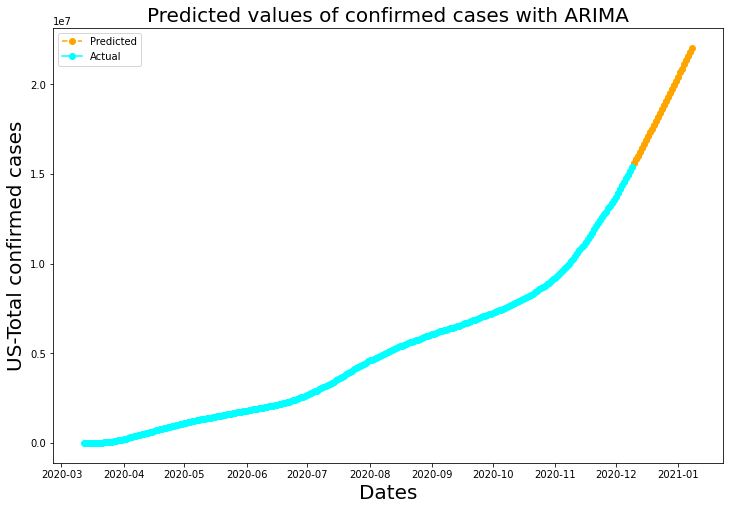

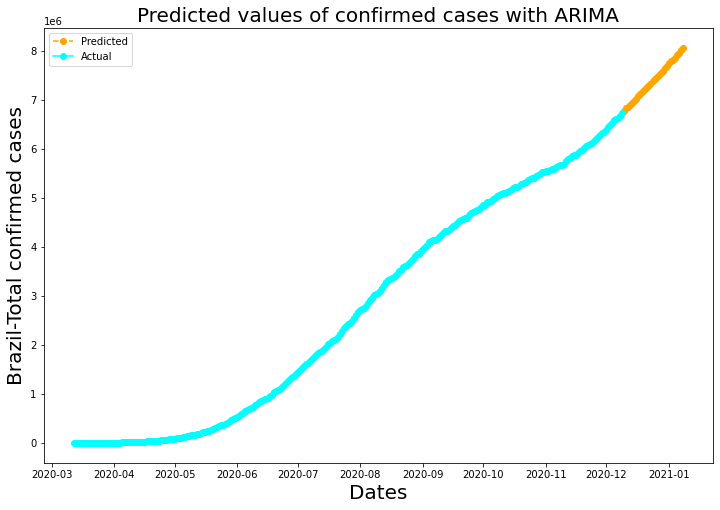

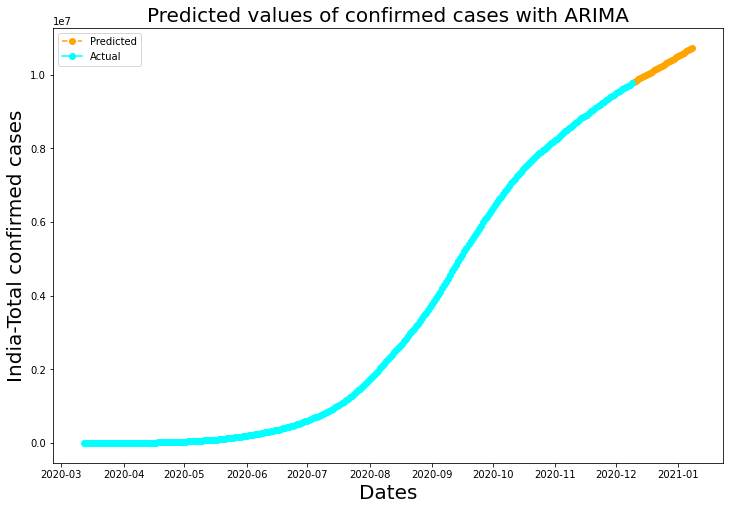

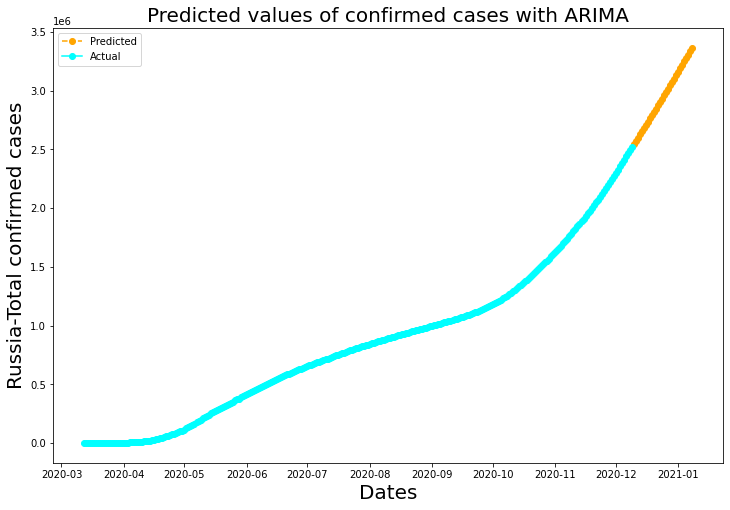

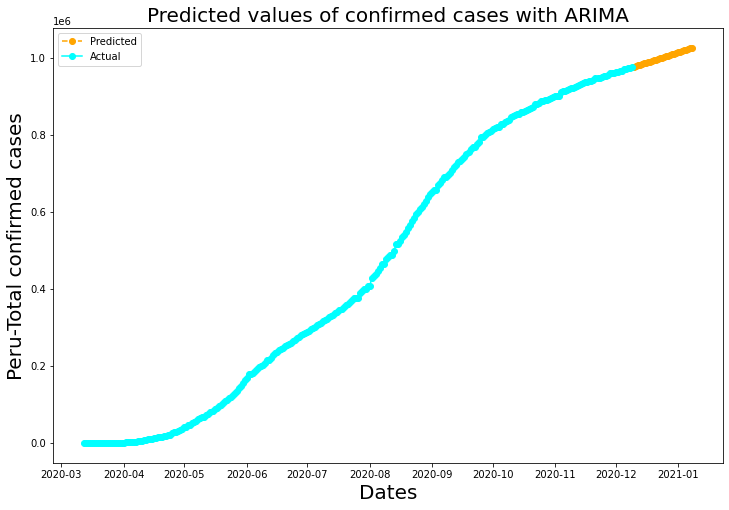

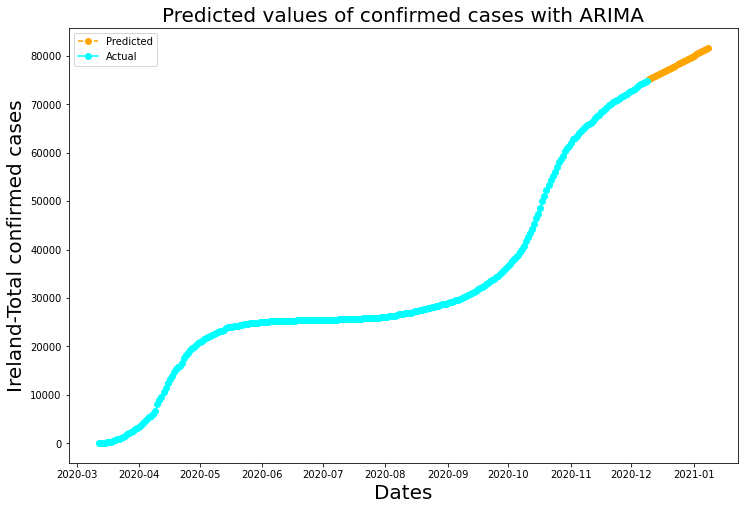

In [65]:
# arima model not included in the research just done for my understanding
most_affected5=['US','Brazil','India','Russia','Peru','Ireland'] # ireland taken as one of the five just in the prediction
def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected5[i]].iloc[50:,:]
    return df

k=0
for j in most_affected5:
    data = pd.DataFrame(columns = ['Date','y'])
    data['Date'] = covid19_world['Date'][50:]
    data['y'] = country_df(k)['Confirmed'].values

    arima = ARIMA(data['y'], order=(2, 2, 3))
    arima = arima.fit(trend='c', full_output=True, disp=True)
    forecast = arima.forecast(steps= 30)
    pred = list(forecast[0])

    start_date = data['Date'].max()
    prediction_dates = []
    for i in range(30):
        date = start_date + timedelta(days=1)
        prediction_dates.append(date)
        start_date = date
    plt.figure(figsize= (12,8))
    plt.xlabel("Dates",fontsize = 20)
    plt.ylabel('%s-Total confirmed cases' %(j),fontsize = 20)
    plt.title("Predicted values of confirmed cases with ARIMA" , fontsize = 20)

    plt.plot_date(y= pred,x= prediction_dates,linestyle ='dashed',color = 'orange',label = 'Predicted');
    plt.plot_date(y=data['y'],x=data['Date'],linestyle = '-',color = 'cyan',label = 'Actual');
    plt.legend();
    k=k+1

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

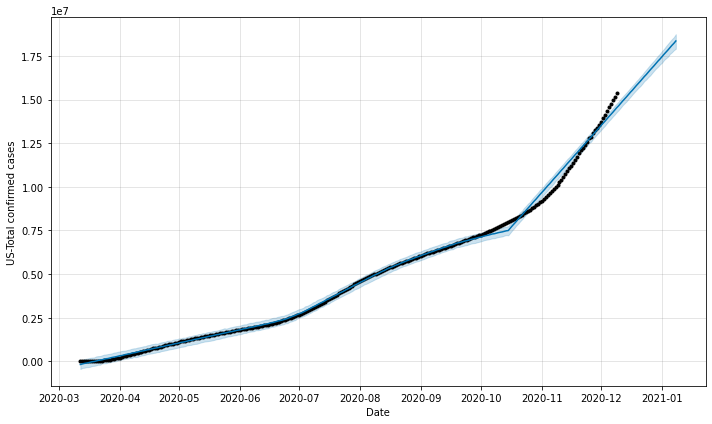

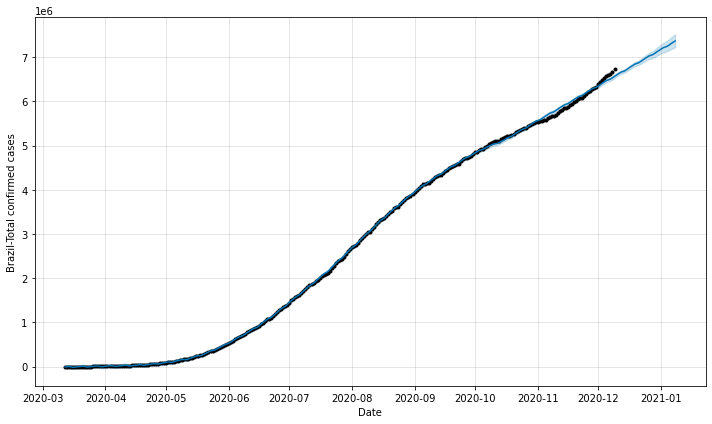

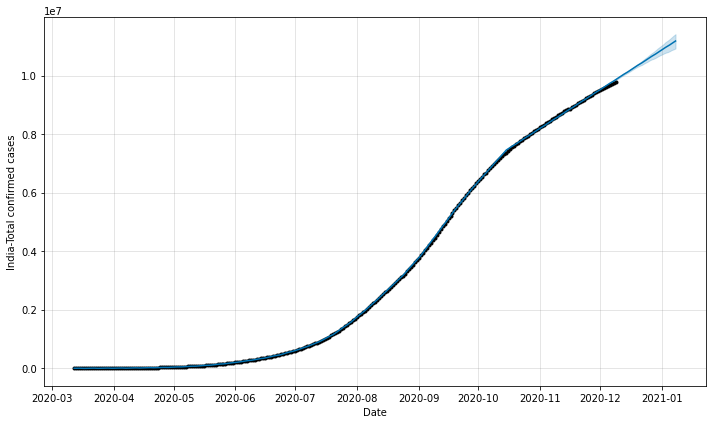

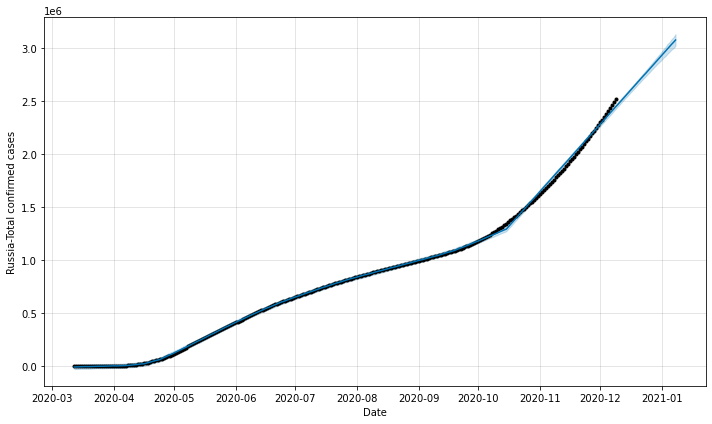

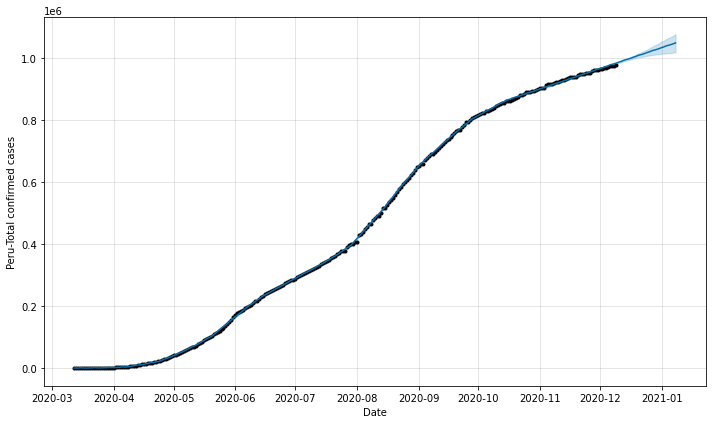

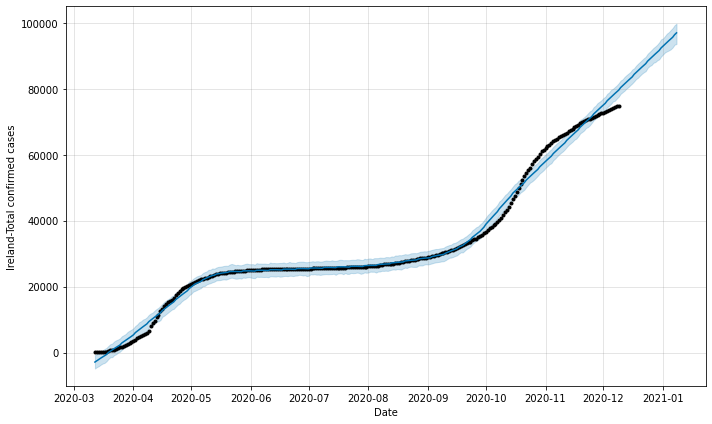

In [66]:
def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected5[i]].iloc[50:,:]
    return df

k=0
for j in most_affected5:
    data = pd.DataFrame(columns = ['ds','y'])
    data['ds'] = covid19_world['Date'][50:]
    data['y'] = country_df(k)['Confirmed'].values

    prop=Prophet()
    prop.fit(data)
    future=prop.make_future_dataframe(periods=30)
    prop_forecast=prop.predict(future)
    forecast = prop_forecast[['ds','yhat']].tail(30)

    fig = plot_plotly(prop, prop_forecast)
    fig = prop.plot(prop_forecast,xlabel='Date',ylabel='%s-Total confirmed cases' %(j))
    k=k+1

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

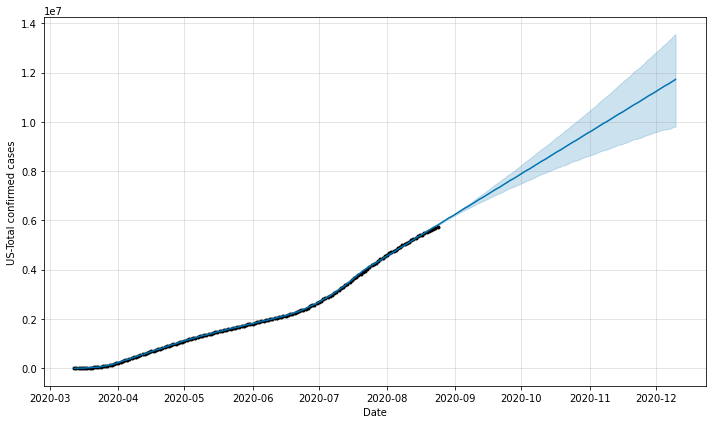

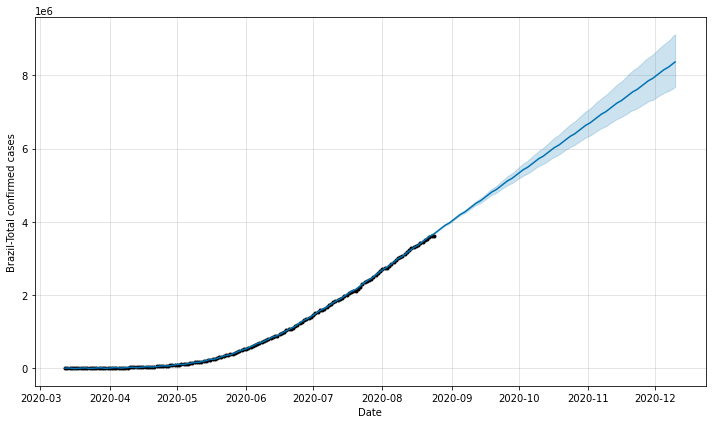

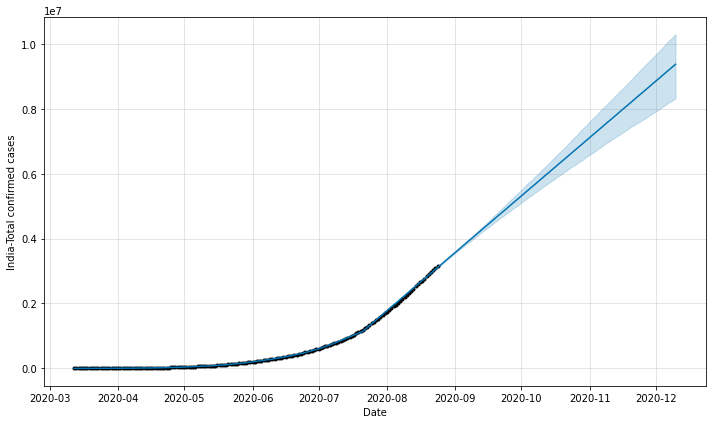

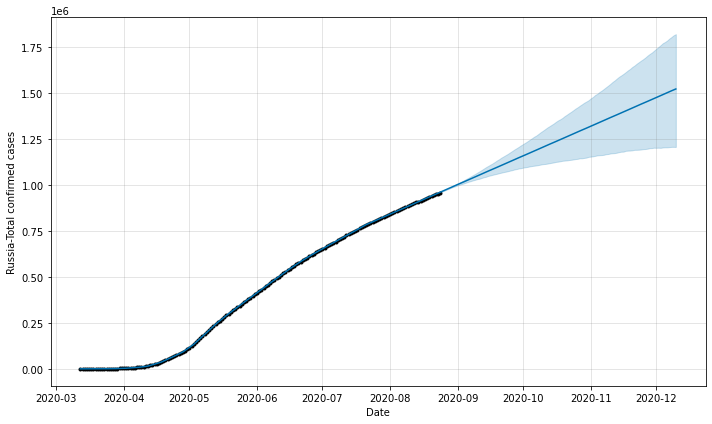

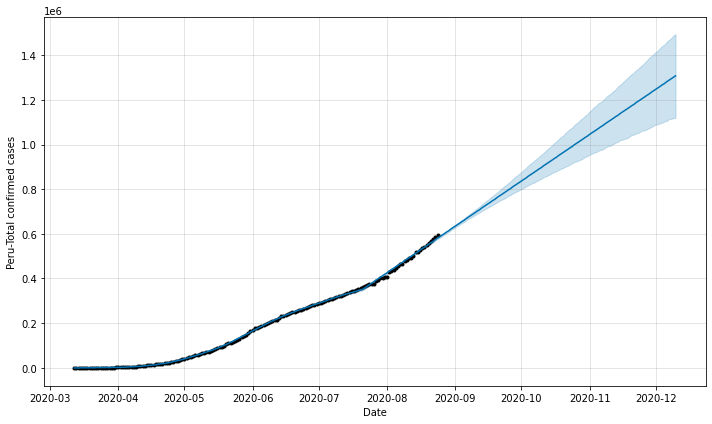

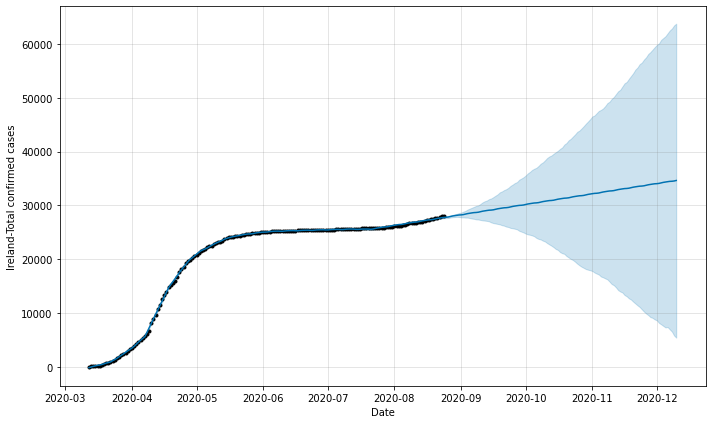

In [67]:
def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected5[i]].iloc[50:216,:]
    return df

k=0
for j in most_affected5:
    data = pd.DataFrame(columns = ['ds','y'])
    data['ds'] = covid19_world['Date'][50:216]
    data['y'] = country_df(k)['Confirmed'].values

    prop=Prophet()
    prop.fit(data)
    future=prop.make_future_dataframe(periods=108)
    prop_forecast=prop.predict(future)
    forecast = prop_forecast[['ds','yhat']].tail(108)

    fig = plot_plotly(prop, prop_forecast)
    fig = prop.plot(prop_forecast,xlabel='Date',ylabel='%s-Total confirmed cases' %(j))
    k=k+1



In [68]:
k=0
for j in most_affected5:
    datar = pd.DataFrame(columns = ['ds','y'])
    datar['ds'] = covid19_world['Date'][215:]
    datar['y'] = country_df(k)['Confirmed'][58:].values


In [69]:
r2_score(datar.y, forecast.yhat)


-4.908922759741218

In [70]:

def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100
mape(datar.y, forecast.yhat)

98.80434001266948

In [165]:
ire_df1=ire_df[['Date','Confirmed']].copy().loc[:]
ire_df1.head()

,Date,Confirmed
83,2020-01-22,0
275,2020-01-23,0
467,2020-01-24,0
659,2020-01-25,0
851,2020-01-26,0


In [166]:
len(ire_df1)


323

In [167]:
n_steps=10

#n_steps=5

# training set size
train_size=len(ire_df1)-n_steps

conf=ire_df1['Confirmed'].values.reshape(-1,1)

# split training and test set
train = conf[:train_size]  #['Confirmed'].values.reshape(-1,1)
test = conf[train_size:]   #['Confirmed'].values.reshape(-1,1)

# scaling the data since the data is too skewed
normal = MinMaxScaler()

normal = normal.fit(train)

normal_train = normal.transform(train)
normal_test = normal.transform(test)
len(normal_train)

313

In [168]:
normal_test

array([[1.00419429],
       [1.0077103 ],
       [1.01142011],
       [1.0136626 ],
       [1.01730319],
       [1.02362924],
       [1.02775432],
       [1.03082737],
       [1.03378968],
       [1.03680735]])

In [169]:
from keras.preprocessing.sequence import TimeseriesGenerator

In [170]:
n_input = n_steps 
n_features = 1 
generator = TimeseriesGenerator(normal_train,normal_train,length = n_input,batch_size=1)

# number of samples
print('Samples: %d' % len(generator))

for i in range(len(generator)-2,len(generator)):
    x, y = generator[i]
    print('%s => %s' % (x, y))

Samples: 303
[[[0.95593915]
  [0.96168381]
  [0.96623801]
  [0.97095832]
  [0.97536025]
  [0.97882089]
  [0.98185241]
  [0.98540995]
  [0.98965961]
  [0.99249734]]] => [[0.99586108]]
[[[0.96168381]
  [0.96623801]
  [0.97095832]
  [0.97536025]
  [0.97882089]
  [0.98185241]
  [0.98540995]
  [0.98965961]
  [0.99249734]
  [0.99586108]]] => [[1.]]


In [180]:
#Multilayer Perceptron (MLP) with one hidden layer model
from keras.models import Sequential
from keras.layers import Dense, Activation,Flatten

model = Sequential()
model.add(Dense(100, activation='relu',input_shape=(n_input,n_features)))
model.add(Flatten())
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mse')

In [181]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 10, 100)           200       
_________________________________________________________________
flatten_4 (Flatten)          (None, 1000)              0         
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 1001      
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________


In [182]:
validation_set = np.append(normal_train[-1],normal_test)
validation_set=validation_set.reshape(n_steps+1,1)
validation_set

array([[1.        ],
       [1.00419429],
       [1.0077103 ],
       [1.01142011],
       [1.0136626 ],
       [1.01730319],
       [1.02362924],
       [1.02775432],
       [1.03082737],
       [1.03378968],
       [1.03680735]])

In [183]:
n_input = n_steps
n_features = 1
validation_gen = TimeseriesGenerator(validation_set,validation_set,length = n_input,batch_size=1)

In [184]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',patience=20,restore_best_weights=True)

# fit the model
model.fit_generator(generator,validation_data=validation_gen,epochs=200,callbacks=[early_stop],steps_per_epoch=10)

Epoch 1/200
10/10 [==============================] - 0s 9ms/step - loss: 0.0526 - val_loss: 0.2182
Epoch 2/200
10/10 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0023
Epoch 3/200
10/10 [==============================] - 0s 3ms/step - loss: 0.0072 - val_loss: 4.9604e-04
Epoch 4/200
10/10 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0055
Epoch 5/200
10/10 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0045
Epoch 6/200
10/10 [==============================] - 0s 3ms/step - loss: 0.0011 - val_loss: 4.8578e-04
Epoch 7/200
10/10 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 7.7159e-04
Epoch 8/200
10/10 [==============================] - 0s 3ms/step - loss: 6.6140e-04 - val_loss: 5.2170e-05
Epoch 9/200
10/10 [==============================] - 0s 3ms/step - loss: 5.6524e-04 - val_loss: 5.6194e-04
Epoch 10/200
10/10 [==============================] - 0s 3ms/step - loss: 2.6932e

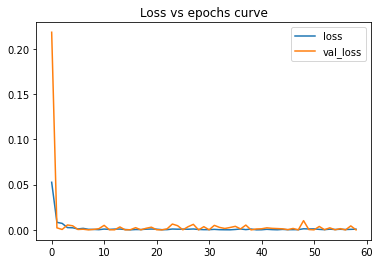

In [185]:
pd.DataFrame(model.history.history).plot(title="Loss vs epochs curve")

In [186]:
model.history.history.keys()

dict_keys(['loss', 'val_loss'])

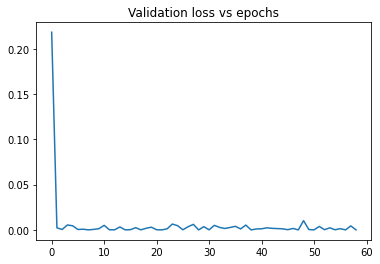

In [187]:
loss_1 = model.history.history["val_loss"]
plt.title("Validation loss vs epochs")
plt.plot(range(len(loss_1)),loss_1)

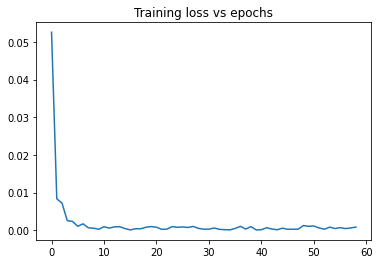

In [188]:
loss_1 = model.history.history["loss"]
plt.title("Training loss vs epochs")
plt.plot(range(len(loss_1)),loss_1)

In [189]:
# list of predictions
test_prediction = []

# last `n_input` points from training set
current_batch = normal_train[-n_input:].reshape(1,n_input,n_features)

current_batch.shape

(1, 10, 1)

In [190]:
# forecast the number of confirmed cases in Ireland for the validation set and the next 10 days

for i in range(n_steps+10):
    current_pred = model.predict(current_batch)[0]
    test_prediction.append(current_pred)
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

test_prediction

[array([1.0031322], dtype=float32),
 array([1.0069146], dtype=float32),
 array([1.0106461], dtype=float32),
 array([1.0142958], dtype=float32),
 array([1.0179433], dtype=float32),
 array([1.0217326], dtype=float32),
 array([1.0254673], dtype=float32),
 array([1.0291739], dtype=float32),
 array([1.0330169], dtype=float32),
 array([1.0368375], dtype=float32),
 array([1.0406739], dtype=float32),
 array([1.0445644], dtype=float32),
 array([1.0484687], dtype=float32),
 array([1.0523868], dtype=float32),
 array([1.0563402], dtype=float32),
 array([1.0603229], dtype=float32),
 array([1.0643224], dtype=float32),
 array([1.0683552], dtype=float32),
 array([1.072418], dtype=float32),
 array([1.0765034], dtype=float32)]

In [191]:
# apply inverse transformations on scaled data
true_prediction = normal.inverse_transform(test_prediction)
true_prediction[:,0]

array([72467.27499998, 72740.51874781, 73010.08525777, 73273.74407411,
       73537.23926628, 73810.98249841, 74080.78152692, 74348.54817104,
       74626.1753242 , 74902.17484748, 75179.31973994, 75460.37438881,
       75742.42800629, 76025.47198057, 76311.07365894, 76598.78522789,
       76887.7110604 , 77179.04819643, 77472.54689384, 77767.68183291])

In [192]:
# number of days in future considered to forecast
future_days = 10

# first date of test
first_date = ire_df1.iloc[train_size:]['Date'].tolist()[0]
first_date=pd.to_datetime(first_date)
print(type(first_date))

# find dates related to days from start of test set to future
dates_first_to_futures = pd.Series([(first_date + timedelta(days=i)) for i in range(n_steps+10)])
print(dates_first_to_futures.shape)

<class 'pandas._libs.tslibs.timestamps.Timestamp'>
(20,)


In [193]:
prediction_df = pd.DataFrame(columns=["Confirmed","Confirmed_predicted"],index=dates_first_to_futures)

prediction_df.loc[:,"Confirmed_predicted"] = true_prediction[:,0]
test_set=ire_df1.iloc[train_size:]['Confirmed'].values.tolist()
prediction_df.loc[:n_steps,"Confirmed"] = ire_df1.iloc[train_size:]['Confirmed'].values.tolist()
prediction_df

,Confirmed,Confirmed_predicted
2020-11-30,72544,72467.275000
2020-12-01,72798,72740.518748
2020-12-02,73066,73010.085258
2020-12-03,73228,73273.744074
2020-12-04,73491,73537.239266
2020-12-05,73948,73810.982498
2020-12-06,74246,74080.781527
2020-12-07,74468,74348.548171
2020-12-08,74682,74626.175324
2020-12-09,74900,74902.174847


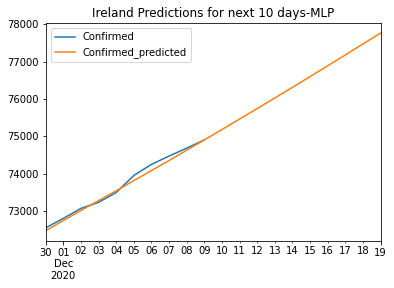

In [194]:

prediction_df.plot(title="Ireland Predictions for next 10 days-MLP")

In [195]:

MAPE = np.mean(np.abs(np.array(prediction_df["Confirmed"][:n_steps]) -\
                      np.array(prediction_df["Confirmed_predicted"][:n_steps]))/np.array(prediction_df["Confirmed"][:n_steps]))
print("MAPE is ",MAPE*100," %")

MAPE is  0.10325138342004382  %


In [196]:
print("Accuracy: ", 100-MAPE,"%")

Accuracy:  99.9989674861658 %


In [197]:
#R-nn long short-term memory(LSTM)
n_input = n_steps 
n_features = 1 
generator = TimeseriesGenerator(normal_train,normal_train,length = n_input,batch_size=2)

# number of samples
print('Samples: %d' % len(generator))

Samples: 152


In [230]:
# A recurrent neural network (LSTM) model with two hidden layers containing 150+75 nodes

from keras.layers import Dense, LSTM, Dropout, Activation

model = Sequential()
model.add(LSTM(150,activation="relu",input_shape=(n_input,n_features)))
model.add(Dense(75, activation='relu'))
model.add(Dense(units=1))
model.compile(optimizer="adam",loss="mse")

model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 150)               91200     
_________________________________________________________________
dense_18 (Dense)             (None, 75)                11325     
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 76        
Total params: 102,601
Trainable params: 102,601
Non-trainable params: 0
_________________________________________________________________


In [231]:
validation_set = np.append(normal_train[-1],normal_test)
validation_set=validation_set.reshape(11,1)
validation_set

array([[1.        ],
       [1.00419429],
       [1.0077103 ],
       [1.01142011],
       [1.0136626 ],
       [1.01730319],
       [1.02362924],
       [1.02775432],
       [1.03082737],
       [1.03378968],
       [1.03680735]])

In [232]:
n_input = n_steps
n_features = 1
validation_gen = TimeseriesGenerator(validation_set,validation_set,length = n_input,batch_size=1)

In [233]:
# fit model
model.fit_generator(generator,validation_data=validation_gen,epochs=200,callbacks=[early_stop],steps_per_epoch=10)
#model.fit_generator(generator,validation_data=validation_gen,epochs=500,callbacks=[early_stop],steps_per_epoch=1)

Epoch 1/200
10/10 [==============================] - 0s 18ms/step - loss: 0.1229 - val_loss: 0.5325
Epoch 2/200
10/10 [==============================] - 0s 5ms/step - loss: 0.0821 - val_loss: 0.0773
Epoch 3/200
10/10 [==============================] - 0s 5ms/step - loss: 0.0042 - val_loss: 0.0095
Epoch 4/200
10/10 [==============================] - 0s 6ms/step - loss: 0.0022 - val_loss: 0.0212
Epoch 5/200
10/10 [==============================] - 0s 6ms/step - loss: 0.0025 - val_loss: 0.0086
Epoch 6/200
10/10 [==============================] - 0s 6ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 7/200
10/10 [==============================] - 0s 5ms/step - loss: 0.0030 - val_loss: 0.0015
Epoch 8/200
10/10 [==============================] - 0s 5ms/step - loss: 9.1674e-04 - val_loss: 1.0244e-05
Epoch 9/200
10/10 [==============================] - 0s 5ms/step - loss: 8.8606e-04 - val_loss: 4.6399e-04
Epoch 10/200
10/10 [==============================] - 0s 5ms/step - loss: 9.1077e-04 - val_l

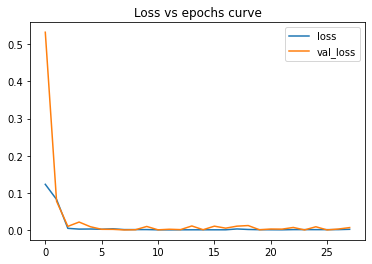

In [234]:
pd.DataFrame(model.history.history).plot(title="Loss vs epochs curve")

In [235]:

model.history.history.keys()

dict_keys(['loss', 'val_loss'])

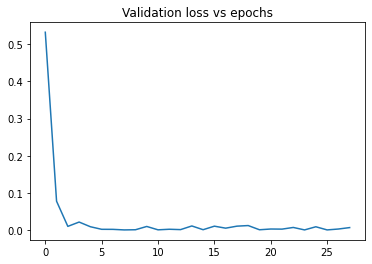

In [236]:
loss_1 = model.history.history["val_loss"]
plt.title("Validation loss vs epochs")
plt.plot(range(len(loss_1)),loss_1)

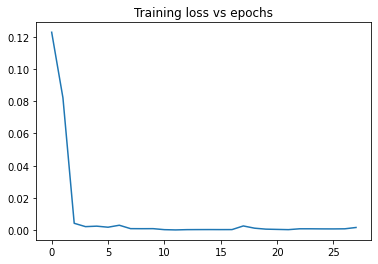

In [237]:
loss_1 = model.history.history["loss"]
plt.title("Training loss vs epochs")
plt.plot(range(len(loss_1)),loss_1)

In [238]:
# list of predictions
test_prediction = []

#last `n_input` points from training set
current_batch = normal_train[-n_input:].reshape(1,n_input,n_features)

current_batch.shape

(1, 10, 1)

In [239]:
# forecast the number of Confirmed cases in Ireland for validation set and the next 10 days

for i in range(n_steps+10):
    current_pred = model.predict(current_batch)[0]
    test_prediction.append(current_pred)
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

test_prediction

[array([1.0032307], dtype=float32),
 array([1.0071619], dtype=float32),
 array([1.0110998], dtype=float32),
 array([1.0150621], dtype=float32),
 array([1.0191039], dtype=float32),
 array([1.023251], dtype=float32),
 array([1.0274785], dtype=float32),
 array([1.0317636], dtype=float32),
 array([1.0361742], dtype=float32),
 array([1.0406951], dtype=float32),
 array([1.0452906], dtype=float32),
 array([1.0500176], dtype=float32),
 array([1.0548506], dtype=float32),
 array([1.059797], dtype=float32),
 array([1.0648646], dtype=float32),
 array([1.070058], dtype=float32),
 array([1.0753804], dtype=float32),
 array([1.0808377], dtype=float32),
 array([1.0864371], dtype=float32),
 array([1.0921825], dtype=float32)]

In [240]:

# apply inverse transformations on scaled data
true_prediction = normal.inverse_transform(test_prediction)
true_prediction[:,0]

array([72474.38834536, 72758.37961745, 73042.86176205, 73329.10071349,
       73621.08373439, 73920.67958498, 74226.07117581, 74535.63087702,
       74854.25880182, 75180.85264003, 75512.83746397, 75854.32110143,
       76203.46062756, 76560.79858565, 76926.88613081, 77302.05912316,
       77686.55869305, 78080.79820681, 78485.30298412, 78900.35721433])

In [241]:
# number of days in future considered to forecast
future_days = 10

# first date of test
first_date = ire_df1.iloc[train_size:]['Date'].tolist()[0]
first_date=pd.to_datetime(first_date)
print(type(first_date))
# find dates related to days from start of test set to future
dates_first_to_futures = pd.Series([(first_date + timedelta(days=i)) for i in range(n_steps+10)])
print(dates_first_to_futures.shape)

<class 'pandas._libs.tslibs.timestamps.Timestamp'>
(20,)


In [242]:
prediction_df = pd.DataFrame(columns=["Confirmed","Confirmed_predicted"],index=dates_first_to_futures)

prediction_df.loc[:,"Confirmed_predicted"] = true_prediction[:,0]
test_set=ire_df1.iloc[train_size:]['Confirmed'].values.tolist()
prediction_df.loc[:n_steps,"Confirmed"] = ire_df1.iloc[train_size:]['Confirmed'].values.tolist()
prediction_df

,Confirmed,Confirmed_predicted
2020-11-30,72544,72474.388345
2020-12-01,72798,72758.379617
2020-12-02,73066,73042.861762
2020-12-03,73228,73329.100713
2020-12-04,73491,73621.083734
2020-12-05,73948,73920.679585
2020-12-06,74246,74226.071176
2020-12-07,74468,74535.630877
2020-12-08,74682,74854.258802
2020-12-09,74900,75180.852640


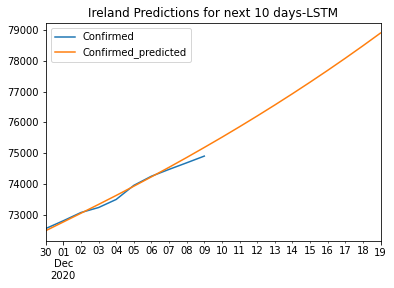

In [243]:
prediction_df.plot(title="Ireland Predictions for next 10 days-LSTM")

In [244]:
MAPE = np.mean(np.abs(np.array(prediction_df["Confirmed"][:n_steps]) -\
                      np.array(prediction_df["Confirmed_predicted"][:n_steps]))/np.array(prediction_df["Confirmed"][:n_steps]))
print("MAPE is ",MAPE*100, " %")

MAPE is  0.12573520838004137  %


In [245]:
print("Accuracy: ", 100-MAPE,"%")

Accuracy:  99.9987426479162 %
